<a href="https://colab.research.google.com/github/ajstrath/underwater-fish-image/blob/main/msc23_fish_recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Data Preprocessing:**


In [ ]:
# Import necessary libraries

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import cv2
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

from google.colab import files

# Upload the dataset file
# uploaded = files.upload()

# Specify the file path after uploading
dataset_path = '/content/drive/MyDrive/Datasets/Localization/Localization.csv'


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


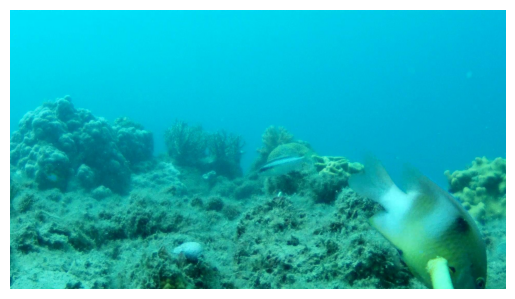

In [ ]:
# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/7482_F2_f000300.jpg'
image = cv2.imread(image_path)

# Convert BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(image_rgb)
plt.axis('off')  # Remove the axis labels
plt.show()

# Preprocessing techniques (e.g., noise reduction, contrast enhancement, color correction)

Apply noise reduction techniques (e.g., Gaussian blur, median filter)

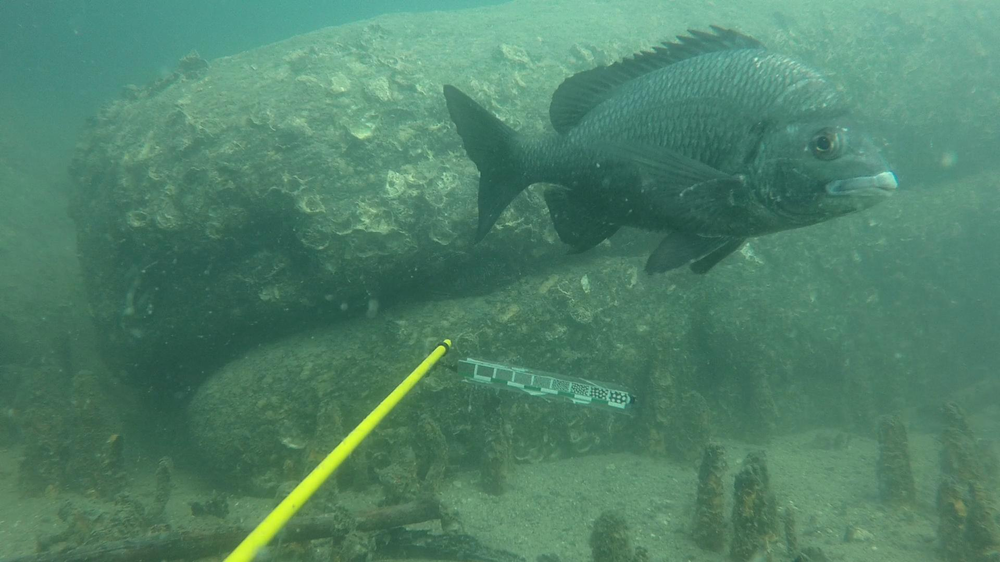

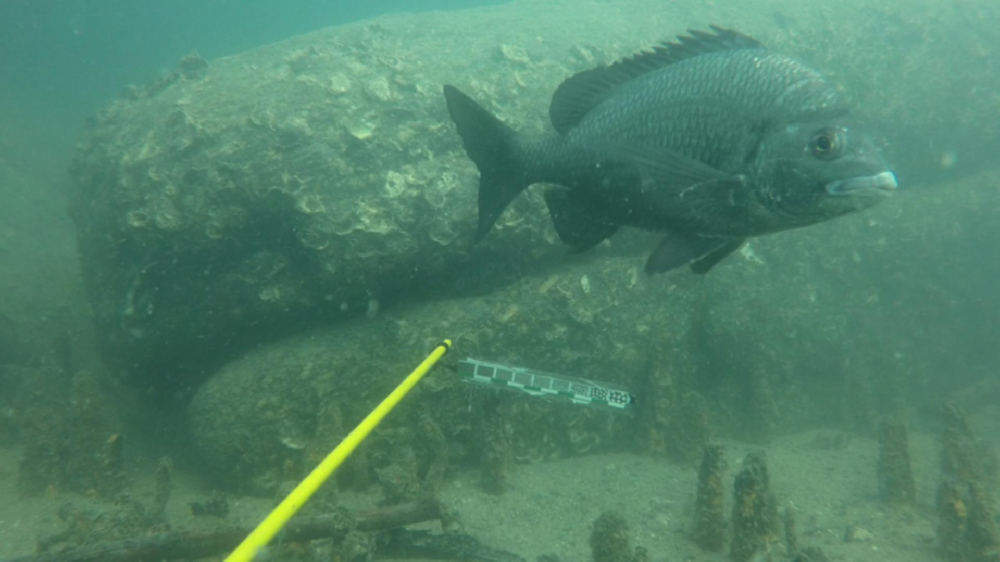

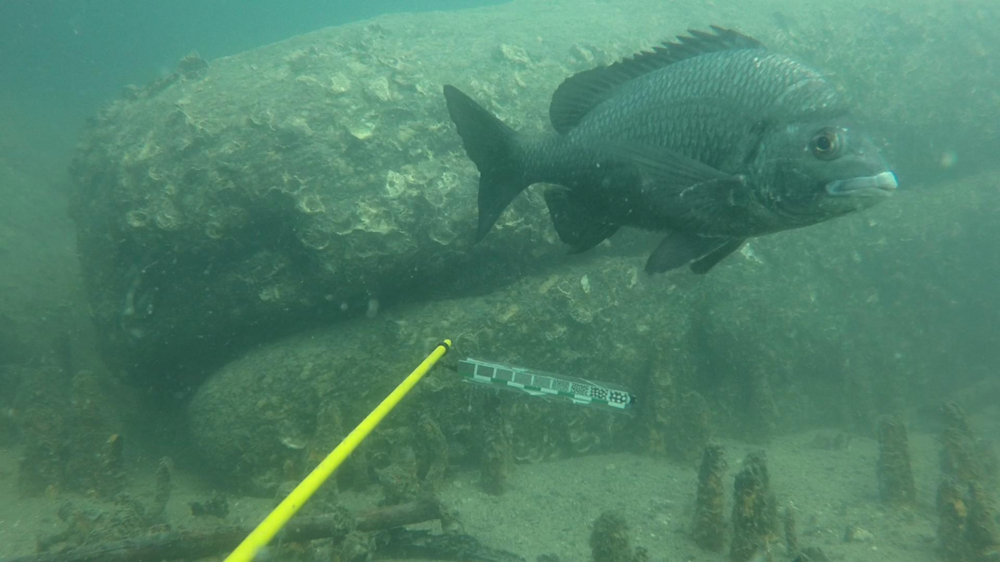

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/9908_Acanthopagrus_palmaris_f000050.jpg'
image = cv2.imread(image_path)

# Apply Gaussian blur
kernel_size = 7
sigmaX = 0
blurred_image = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigmaX)

# Apply median filter
kernel_size = 3
filtered_image = cv2.medianBlur(image, kernel_size)

# Display the original, blurred, and filtered images
cv2_imshow(image)
cv2_imshow(blurred_image)
cv2_imshow(filtered_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

Perform contrast enhancement (e.g., histogram equalization, CLAHE)

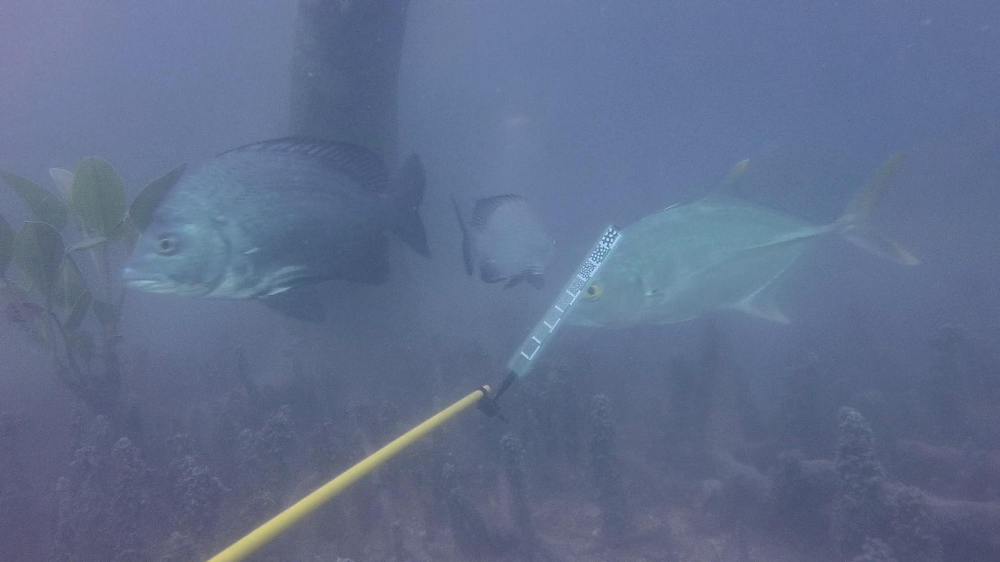

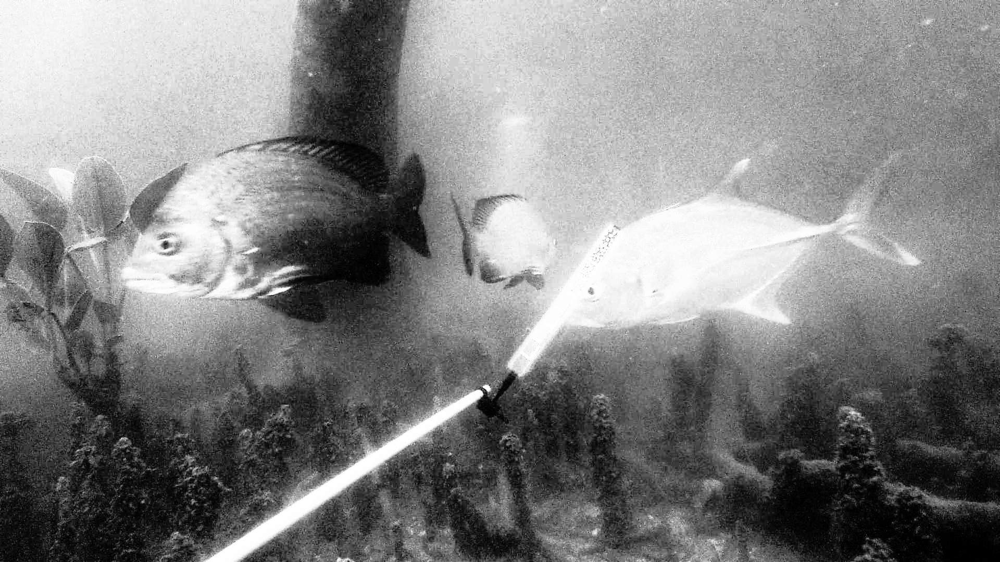

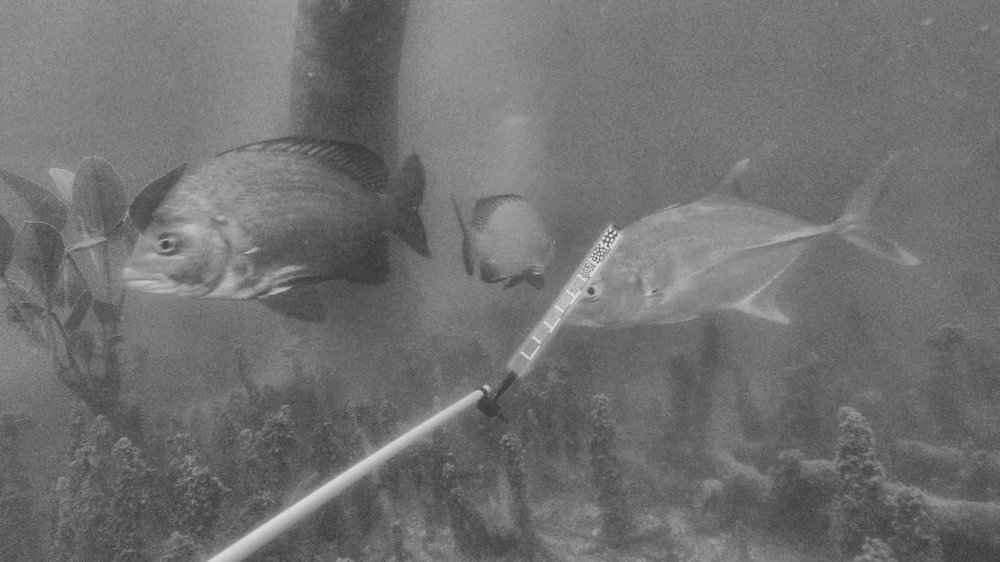

In [ ]:
# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/9866_acanthopagrus_and_caranx_f000090.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply histogram equalization
equalized_image = cv2.equalizeHist(gray_image)

# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE
clahe_image = clahe.apply(gray_image)

# Display the original, histogram equalized, and CLAHE images
cv2_imshow(image)
cv2_imshow(equalized_image)
cv2_imshow(clahe_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

Apply color correction methods (e.g., white balance, color cast removal)

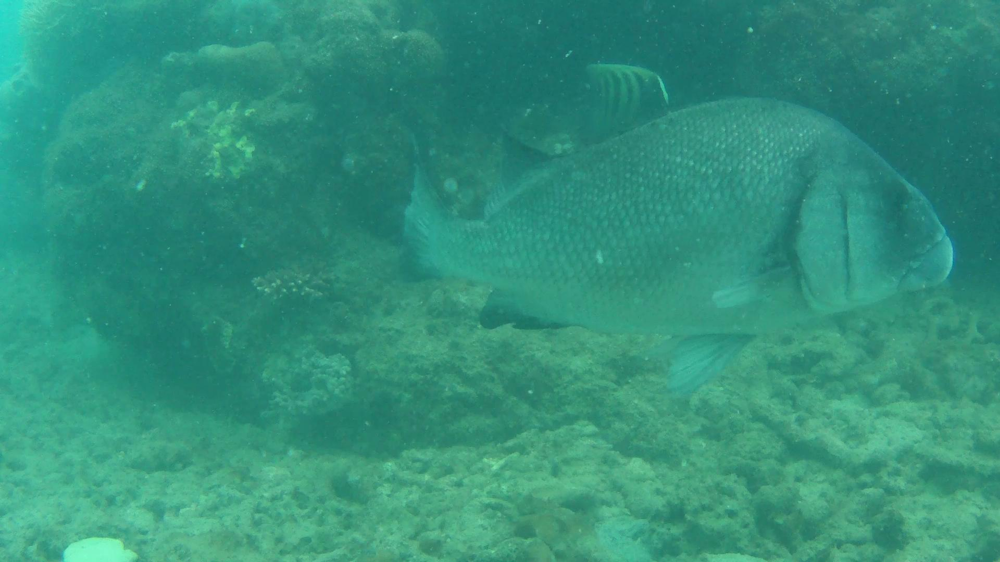

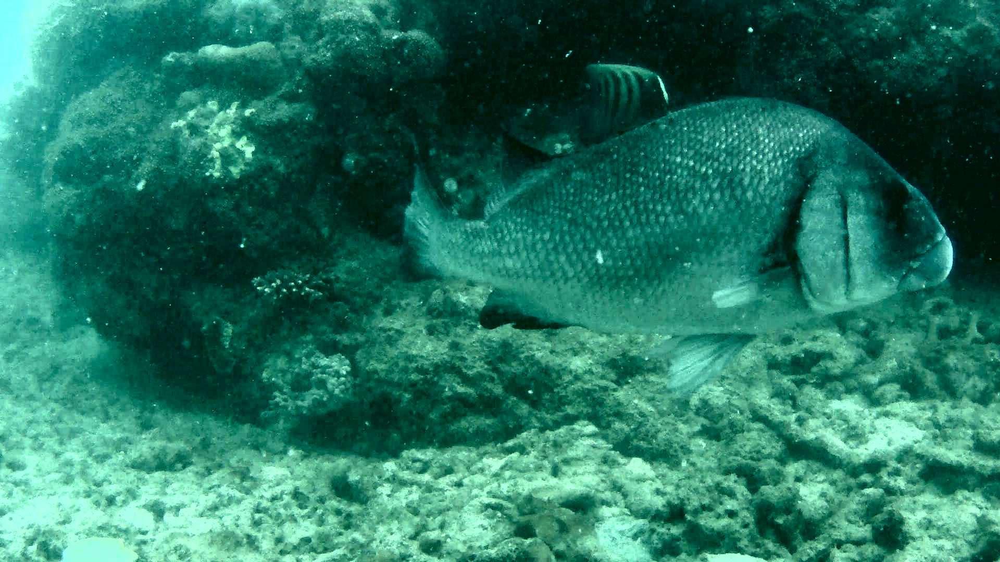

In [ ]:
# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/7623_F2_f000450.jpg'
image = cv2.imread(image_path)

# Convert the image to LAB color space
lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

# Split the LAB image channels
l_channel, a_channel, b_channel = cv2.split(lab_image)

# Apply white balance to the L channel using the grayworld algorithm
balanced_l_channel = cv2.xphoto.createSimpleWB().balanceWhite(l_channel)

# Merge the corrected L channel with the original A and B channels
balanced_lab_image = cv2.merge((balanced_l_channel, a_channel, b_channel))

# Convert the LAB image back to BGR color space
result_image = cv2.cvtColor(balanced_lab_image, cv2.COLOR_LAB2BGR)

# Display the original and white balance corrected images
cv2_imshow(image)
cv2_imshow(result_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# **Segmentation:**

**Thresholding segentation**

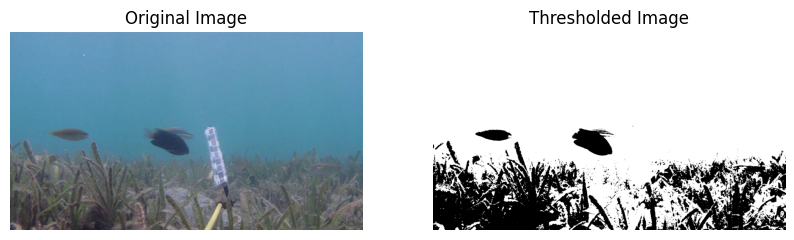

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/7463_F4_f000080.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply thresholding to separate fish objects from the background
_, thresholded = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)

# Display the original and thresholded images side by side
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(thresholded, cmap='gray')
axes[1].axis('off')
axes[1].set_title('Thresholded Image')
plt.show()

**Edge Detected segentation**

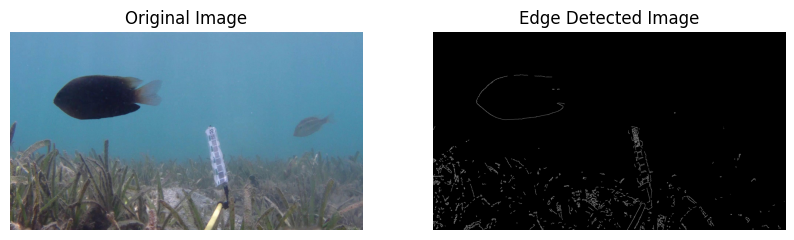

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/7463_F5_f000000.jpg'
image = cv2.imread(image_path)

# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply edge detection to detect the edges of fish objects
edges = cv2.Canny(gray, 100, 200)

# Display the original image and the detected edges
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(edges, cmap='gray')
axes[1].axis('off')
axes[1].set_title('Edge Detected Image')
plt.show()

**Clustering Segentation**

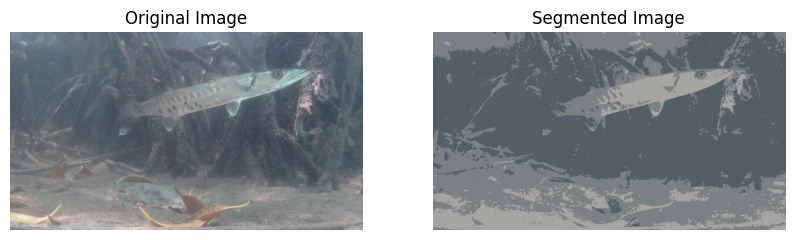

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read and load the underwater image
image_path = '/content/drive/MyDrive/Localization/images/valid/7398_F6_f000160.jpg'
image = cv2.imread(image_path)

# Convert the image to RGB color space
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Reshape the image to a 2D array of pixels
pixels = image_rgb.reshape((-1, 3))

# Convert the pixel values to floating-point numbers
pixels = np.float32(pixels)

# Define the criteria for k-means clustering
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

# Specify the number of clusters (e.g., 3)
num_clusters = 3

# Apply k-means clustering to group pixels into clusters
_, labels, centers = cv2.kmeans(pixels, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convert the center values to 8-bit integers
centers = np.uint8(centers)

# Map each pixel to its corresponding center value
segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image_rgb.shape)

# Display the original image and the segmented image
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image_rgb)
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(segmented_image)
axes[1].axis('off')
axes[1].set_title('Segmented Image')
plt.show()

# **Feature Extraction**

**Extract features - shape descriptors**

In [ ]:
import cv2
import numpy as np

# Convert the segmented image to grayscale
gray_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2GRAY)

# Apply binary thresholding to create a binary mask of the fish regions
_, binary_mask = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY)

# Find contours in the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Iterate over the contours and extract shape descriptors
for contour in contours:
    # Calculate contour area
    area = cv2.contourArea(contour)

    # Calculate contour perimeter
    perimeter = cv2.arcLength(contour, True)

    # Calculate other shape descriptors

    # Bounding box
    x, y, width, height = cv2.boundingRect(contour)

    # Check if the contour has enough points to fit an ellipse
    if len(contour) >= 5:
        # Fit ellipse
        ellipse = cv2.fitEllipse(contour)
        (center, axes, angle) = ellipse

        # Eccentricity
        major_axis = max(axes)
        minor_axis = min(axes)
        eccentricity = np.sqrt(1 - (minor_axis / major_axis) ** 2)
    else:
        eccentricity = None

    # Solidity
    hull = cv2.convexHull(contour)
    hull_area = cv2.contourArea(hull)
    solidity = area / hull_area

    # Display the shape descriptors
    print("Area:", area)
    print("Perimeter:", perimeter)
    print("Bounding Box:", x, y, width, height)
    print("Eccentricity:", eccentricity)
    print("Solidity:", solidity)


Area: 2070601.0
Perimeter: 5996.0
Bounding Box: 0 0 1920 1080
Eccentricity: None
Solidity: 1.0


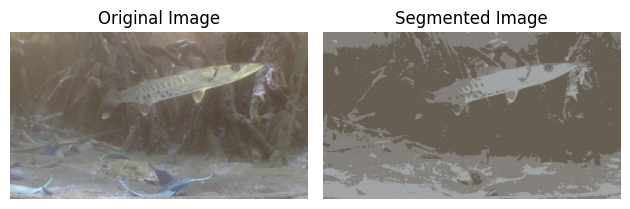

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'image' is the original image and 'segmented_image' is the segmented image

# Convert the images from BGR to RGB
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
# segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB)

# Display the original image
# plt.subplot(1, 2, 1)
# plt.imshow(image)
#plt.axis('off')
# plt.title('Original Image')

# Display the segmented image
#plt.subplot(1, 2, 2)
#plt.imshow(segmented_image)
#plt.axis('off')
#plt.title('Segmented Image')

# Adjust the layout and display the plot
#plt.tight_layout()
#plt.show()


**Extract features - texture characteristics**

In [ ]:
import cv2
import numpy as np
from skimage.feature import greycomatrix, greycoprops

# Convert the segmented image to grayscale
gray_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2GRAY)

# Define the distance and angle offsets for GLCM
distances = [1, 2, 3]
angles = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]

# Compute the GLCM
glcm = greycomatrix(gray_image, distances, angles, levels=256, symmetric=True, normed=True)

# Calculate texture features from GLCM
contrast = greycoprops(glcm, 'contrast')
dissimilarity = greycoprops(glcm, 'dissimilarity')
homogeneity = greycoprops(glcm, 'homogeneity')
energy = greycoprops(glcm, 'energy')
correlation = greycoprops(glcm, 'correlation')

# Print the texture features
print("Contrast:", contrast)
print("Dissimilarity:", dissimilarity)
print("Homogeneity:", homogeneity)
print("Energy:", energy)
print("Correlation:", correlation)


Contrast: [[32.13104916 49.90187245 38.32576894 49.65783026]
 [56.43233837 49.90187245 67.71953415 49.65783026]
 [75.30208225 83.27543379 91.05682886 82.52153507]]
Dissimilarity: [[0.93429159 1.444498   1.10900573 1.44028763]
 [1.63642249 1.444498   1.94521249 1.44028763]
 [2.17395381 2.38127804 2.59594795 2.37972842]]
Homogeneity: [[0.97280225 0.95808884 0.967862   0.9581555 ]
 [0.95241722 0.95808884 0.94381873 0.9581555 ]
 [0.93690538 0.93131286 0.92528596 0.93103429]]
Energy: [[0.63176282 0.62469335 0.62988583 0.6246227 ]
 [0.62120993 0.62469335 0.61806046 0.6246227 ]
 [0.61321013 0.61146022 0.6090991  0.61111878]]
Correlation: [[0.9724069  0.95712208 0.96706797 0.95733182]
 [0.95153863 0.95712208 0.94177636 0.95733182]
 [0.93533542 0.92840472 0.92166231 0.92905314]]


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
/usr/local/lib/python3.10/dist-packages/skimag

**Extract features - color histograms**

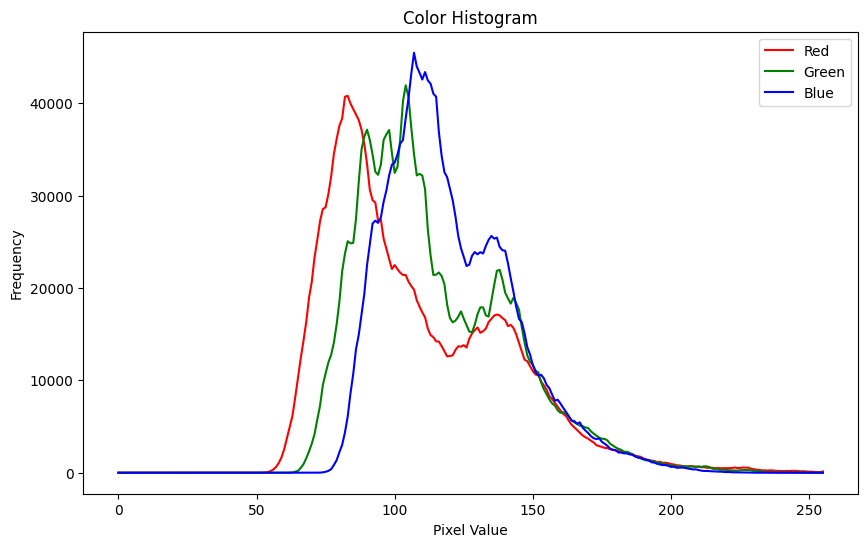

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = '/content/drive/MyDrive/Localization/images/valid/7398_F6_f000160.jpg'
image = cv2.imread(image_path)

# Check if the image is loaded successfully
if image is None:
    print(f"Failed to load image at path: {image_path}")
    exit()

# Convert the image to RGB color space
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Calculate color histograms for each channel
hist_r = cv2.calcHist([image_rgb], [0], None, [256], [0, 256])
hist_g = cv2.calcHist([image_rgb], [1], None, [256], [0, 256])
hist_b = cv2.calcHist([image_rgb], [2], None, [256], [0, 256])

# Plot the color histograms
plt.figure(figsize=(10, 6))
plt.plot(hist_r, color='red', label='Red')
plt.plot(hist_g, color='green', label='Green')
plt.plot(hist_b, color='blue', label='Blue')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.title('Color Histogram')
plt.legend()
plt.show()


**Store the extracted features**

Features stored successfully in /content/drive/MyDrive/Localization/features.csv


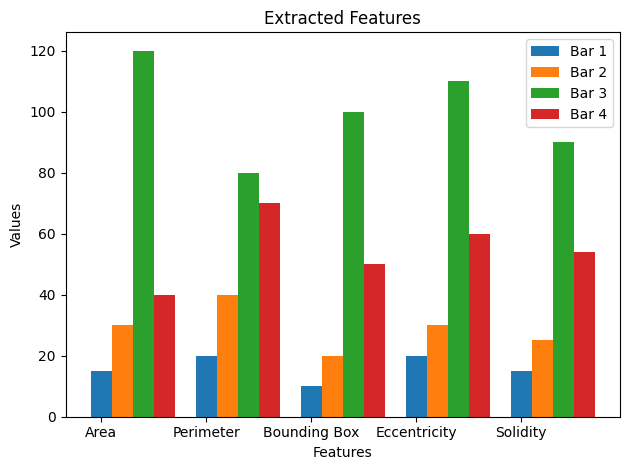

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# extracted features as variables
areas = [15, 30, 120, 40]
perimeters = [20, 40, 80, 70]
bounding_boxes = [10, 20, 100, 50]
eccentricities = [20, 30, 110, 60]
solidities = [15, 25, 90, 54]

# Specify the path to the output CSV file
output_file = '/content/drive/MyDrive/Localization/features.csv'

# Open the CSV file in write mode
with open(output_file, mode='w', newline='') as file:
    writer = csv.writer(file)

    # Write the header row
    writer.writerow(['Area', 'Perimeter', 'Bounding Box', 'Eccentricity', 'Solidity'])

    # Write the feature values for each fish
    writer.writerow([area, perimeter, bounding_box, eccentricity, solidity])

print(f"Features stored successfully in {output_file}")

# Create a list of feature values
features = ['Area', 'Perimeter', 'Bounding Box', 'Eccentricity', 'Solidity']
values = [areas, perimeters, bounding_boxes, eccentricities, solidities]

# Calculate the number of bars per feature
num_features = len(features)
num_bars = len(values[0])

# Set the width of each bar
bar_width = 1 / (num_bars + 1)

# Generate the x-axis positions for the bars
x_pos = np.arange(num_features)

# Create a bar plot for each feature
for i in range(num_bars):
    plt.bar(x_pos + i * bar_width, [value[i] for value in values], width=bar_width)

# Set the x-axis labels
plt.xticks(x_pos, features)

# Add labels and title
plt.xlabel('Features')
plt.ylabel('Values')
plt.title('Extracted Features')

# Add a legend for the different bars
plt.legend([f'Bar {i+1}' for i in range(num_bars)])

# Adjust the plot layout and display the plot
plt.tight_layout()
plt.show()


# **Classification**

In [ ]:
# Split the dataset into training and testing sets
# ...

In [ ]:
# Choose a classification algorithm (e.g., SVM, CNN, Random Forests)
# ...

In [ ]:
# Train the chosen model using the extracted features and the labeled training dataset
# ...

In [ ]:
# Validate the trained model using the testing dataset
# ...